In [0]:
import mlflow

mlflow.pyspark.ml.autolog()

In [0]:
GameDF = spark.read.csv("/FileStore/tables/steam_200k.csv", header=False,inferSchema =True)

In [0]:
GameDF.display()

_c0,_c1,_c2,_c3
151603712,The Elder Scrolls V Skyrim,purchase,1.0
151603712,The Elder Scrolls V Skyrim,play,273.0
151603712,Fallout 4,purchase,1.0
151603712,Fallout 4,play,87.0
151603712,Spore,purchase,1.0
151603712,Spore,play,14.9
151603712,Fallout New Vegas,purchase,1.0
151603712,Fallout New Vegas,play,12.1
151603712,Left 4 Dead 2,purchase,1.0
151603712,Left 4 Dead 2,play,8.9


In [0]:
from pyspark.sql.types import *

# Define the schema
Myschema = StructType([
    StructField("Users_Id", IntegerType(), True),
    StructField("Games_Name", StringType(), True),
    StructField("Users_Behaviour", StringType(), True),
    StructField("Behaviours_Value", DoubleType(), True)
])

#load the dataset

In [0]:
# Read CSV file with specified schema
GamestreamDF = spark.read.csv("/FileStore/tables/steam_200k.csv", header=False, schema=Myschema)
GamestreamDF.display()

Users_Id,Games_Name,Users_Behaviour,Behaviours_Value
151603712,The Elder Scrolls V Skyrim,purchase,1.0
151603712,The Elder Scrolls V Skyrim,play,273.0
151603712,Fallout 4,purchase,1.0
151603712,Fallout 4,play,87.0
151603712,Spore,purchase,1.0
151603712,Spore,play,14.9
151603712,Fallout New Vegas,purchase,1.0
151603712,Fallout New Vegas,play,12.1
151603712,Left 4 Dead 2,purchase,1.0
151603712,Left 4 Dead 2,play,8.9


#Exploratory data Analysis

In [0]:
from pyspark.sql.functions import isnan, when, count, col

null_counts= GamestreamDF.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in GamestreamDF.columns])

null_counts.show()

+--------+----------+---------------+----------------+
|Users_Id|Games_Name|Users_Behaviour|Behaviours_Value|
+--------+----------+---------------+----------------+
|       0|         0|              0|               0|
+--------+----------+---------------+----------------+



In [0]:
GamestreamDF.groupBy('Users_Behaviour').count().display()

Users_Behaviour,count
purchase,129511
play,70489


In [0]:
#  Size and Structure
print("Size and Structure of the Dataset:")
print("Number of observations (rows):", GamestreamDF.count())
print("Number of variables (columns):", len(GamestreamDF.columns))
print()

Size and Structure of the Dataset:
Number of observations (rows): 200000
Number of variables (columns): 4



In [0]:
print("Summary Statistics:")
GamestreamDF.describe().show()
print()

Summary Statistics:
+-------+-------------------+----------------+---------------+------------------+
|summary|           Users_Id|      Games_Name|Users_Behaviour|  Behaviours_Value|
+-------+-------------------+----------------+---------------+------------------+
|  count|             200000|          200000|         200000|            200000|
|   mean|  1.0365586594664E8|           140.0|           NULL|17.874383999999914|
| stddev|7.208073512913968E7|             0.0|           NULL|138.05695165086792|
|    min|               5250|     007 Legends|           play|               0.1|
|    max|          309903146|theHunter Primal|       purchase|           11754.0|
+-------+-------------------+----------------+---------------+------------------+




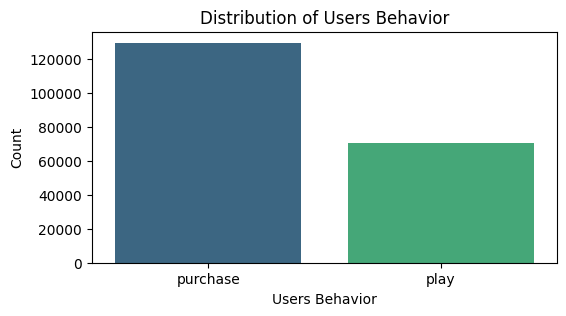

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd 
# Data
data = {'Users_Behaviour': ['purchase', 'play'],
        'count': [129511, 70489]}

# Create a DataFrame
df = pd.DataFrame(data)

# Plotting
plt.figure(figsize=(6, 3))
sns.barplot(x='Users_Behaviour', y='count', data=df, palette='viridis')
plt.xlabel('Users Behavior')
plt.ylabel('Count')
plt.title('Distribution of Users Behavior')
plt.show()


In [0]:
GamestreamDF.groupBy("Games_Name").count().show()

+--------------------+-----+
|          Games_Name|count|
+--------------------+-----+
|              Dota 2| 9682|
|METAL GEAR SOLID ...|  134|
|LEGO Batman The V...|   17|
|                RIFT|  236|
|             Anodyne|   14|
|  Legend of Grimrock|   93|
|Divinity Original...|  138|
|            Meltdown|    4|
|SanctuaryRPG Blac...|    6|
|       Snuggle Truck|   14|
|        Lunar Flight|   16|
|          Dungeons 2|   12|
|      Zuma's Revenge|    7|
|         HassleHeart|    1|
|Ihf Handball Chal...|    1|
|NEON STRUCT Sound...|    2|
|Dust An Elysian Tail|  122|
|Call of Duty Mode...|  634|
|Star Wars Dark Fo...|   70|
|Alien Breed 2 Ass...|   45|
+--------------------+-----+
only showing top 20 rows



In [0]:
from pyspark.sql.functions import col, count

# Filter the DataFrame to include only rows where 'Users_Behaviour' is 'purchase'
purchase_games_df = GamestreamDF.filter(col('Users_Behaviour') == 'purchase')

# Group by 'Name_of_game' column and count the occurrences to get total number of purchases for each game
purchase_counts = purchase_games_df.groupBy('Games_Name').agg(count('*').alias('Total_Frequent_purchases'))

# Order the result by total number of purchases in descending order
purchase_counts = purchase_counts.orderBy('Total_Frequent_purchases', ascending=False)

# Show the result
purchase_counts.show(10)

+--------------------+------------------------+
|          Games_Name|Total_Frequent_purchases|
+--------------------+------------------------+
|              Dota 2|                    4841|
|     Team Fortress 2|                    2323|
|            Unturned|                    1563|
|Counter-Strike Gl...|                    1412|
|Half-Life 2 Lost ...|                     981|
|Counter-Strike So...|                     978|
|       Left 4 Dead 2|                     951|
|      Counter-Strike|                     856|
|            Warframe|                     847|
|Half-Life 2 Death...|                     823|
+--------------------+------------------------+
only showing top 10 rows



In [0]:
# Importing necessary functions from PySpark
from pyspark.sql.functions import col, sum

# Filter the DataFrame to include only rows where 'Users_Behaviour' is 'play' and 'Behaviours_Value' is greater than 0
played_games_df = GamestreamDF.filter((col('Users_Behaviour') == 'play') & (col('Behaviours_Value') > 0))

# Group by 'Games_Name' column, sum the 'Behaviours_Value' column to get total minutes played, and order by total minutes in descending order
game_counts = played_games_df.groupBy('Games_Name').agg(sum('Behaviours_Value').alias('Total_hours_of_play')).orderBy('Total_hours_of_play', ascending=False)

# Show the result (top 10 games by total hours played)
game_counts.show(10)


+--------------------+-------------------+
|          Games_Name|Total_hours_of_play|
+--------------------+-------------------+
|              Dota 2|  981684.5999999999|
|Counter-Strike Gl...|  322771.6000000001|
|     Team Fortress 2| 173673.30000000005|
|      Counter-Strike| 134261.09999999998|
|Sid Meier's Civil...|  99821.30000000002|
|Counter-Strike So...|  96075.50000000003|
|The Elder Scrolls...|            70889.3|
|         Garry's Mod|            49725.3|
|Call of Duty Mode...| 42009.899999999994|
|       Left 4 Dead 2| 33596.700000000004|
+--------------------+-------------------+
only showing top 10 rows



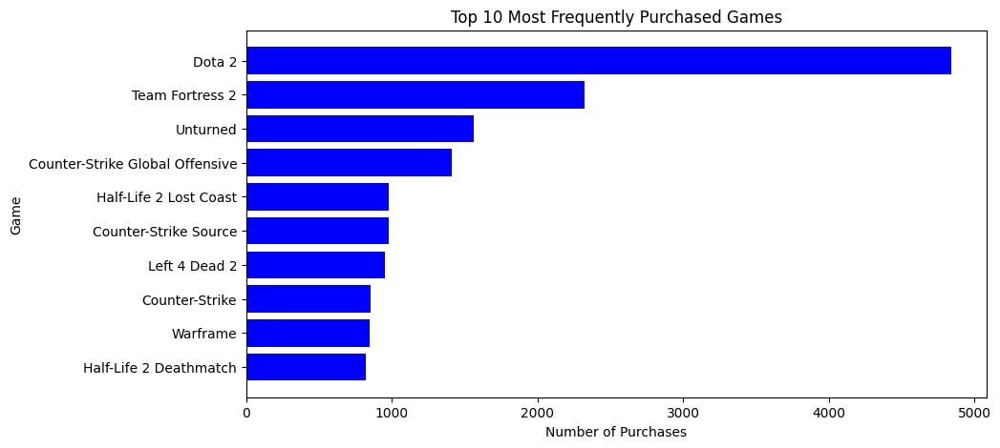

In [0]:
import matplotlib.pyplot as plt

# Function to plot the most frequently purchased games
def plot_top_purchased_games(data):
    games = data['Games_Name']
    counts = data['Total_Frequent_purchases']
    
    plt.figure(figsize=(10, 5))
    plt.barh(games, counts, color='blue')
    plt.xlabel('Number of Purchases')
    plt.ylabel('Game')
    plt.title('Top 10 Most Frequently Purchased Games')
    plt.gca().invert_yaxis()  # Invert y-axis to have the game with the highest count on top
    plt.show()


# Plotting
plot_top_purchased_games(purchase_counts.toPandas().head(10))



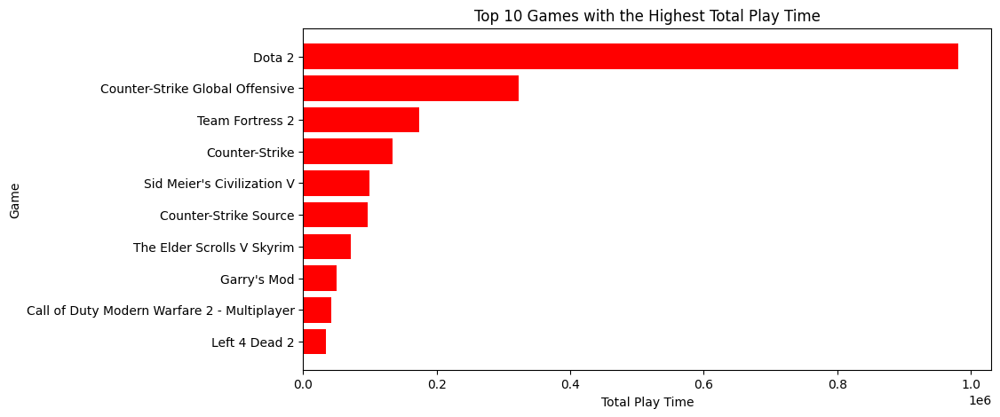

In [0]:
# Function to plot the games with the highest total play time
def plot_top_playtime_games(data):
    games = data['Games_Name']
    play_times = data['Total_hours_of_play']
    
    plt.figure(figsize=(10, 5))
    plt.barh(games, play_times, color='red')
    plt.xlabel('Total Play Time')
    plt.ylabel('Game')
    plt.title('Top 10 Games with the Highest Total Play Time')
    plt.gca().invert_yaxis()
    plt.show()
    
# Plotting
plot_top_playtime_games(game_counts.toPandas().head(10))

In [0]:
from pyspark.sql.functions import col, count, sum

# Filter the DataFrame to include only rows where 'Users_Behaviours' is 'purchase'
purchase_games_df = GamestreamDF.filter(col('Users_Behaviour') == 'purchase')

# Group by 'Games_Name' column and count the occurrences to get total number of purchases for each game
purchase_counts = purchase_games_df.groupBy('Games_Name').agg(count('*').alias('Total_purchases'))

# Filter the DataFrame to include only rows where 'Users_Behaviours' is 'play' and 'Behaviours_Value' is greater than 0
played_games_df = GamestreamDF.filter((col('Users_Behaviour') == 'play') & (col('Behaviours_Value') > 0))

# Group by 'Games_Name' column and sum the 'Behaviours_Value' column to get total hours played for each game
played_minutes = played_games_df.groupBy('Games_Name').agg(sum('Behaviours_Value').alias('Total_hours_of_play'))

# Join the DataFrames based on 'Games_Name' column
joined_df = purchase_counts.join(played_minutes, 'Games_Name')

# Order the result by total number of purchases in descending order
result = joined_df.orderBy('Total_purchases', ascending=False)

# Show the result
result.show()




+--------------------+---------------+-------------------+
|          Games_Name|Total_purchases|Total_hours_of_play|
+--------------------+---------------+-------------------+
|              Dota 2|           4841|  981684.5999999999|
|     Team Fortress 2|           2323| 173673.30000000005|
|            Unturned|           1563| 16096.399999999996|
|Counter-Strike Gl...|           1412|  322771.6000000001|
|Half-Life 2 Lost ...|            981|              184.4|
|Counter-Strike So...|            978|  96075.50000000003|
|       Left 4 Dead 2|            951| 33596.700000000004|
|      Counter-Strike|            856| 134261.09999999998|
|            Warframe|            847|            27074.6|
|Half-Life 2 Death...|            823| 3712.8999999999996|
|         Garry's Mod|            731|            49725.3|
|The Elder Scrolls...|            717|            70889.3|
|           Robocraft|            689|  9096.599999999999|
|Counter-Strike Co...|            679| 418.2000000000000

<Axes: >

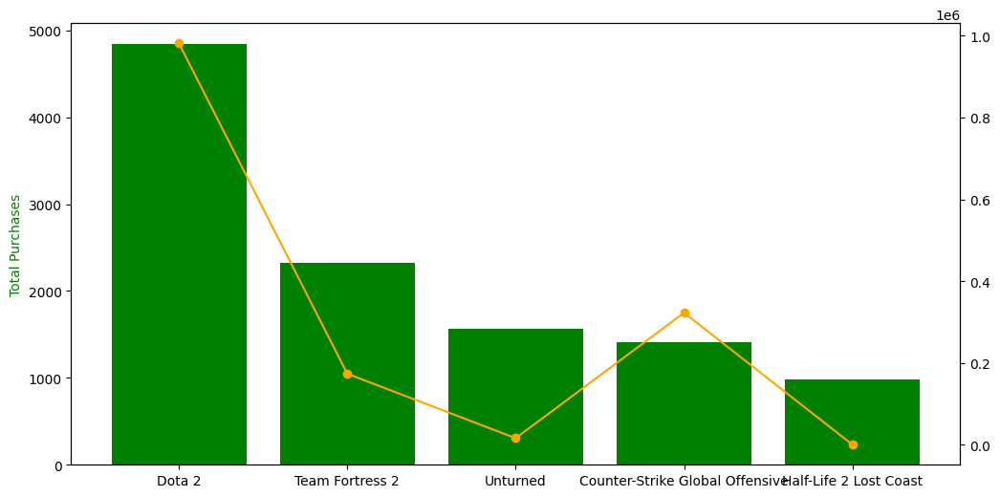

In [0]:
import matplotlib.pyplot as plt

# Convert the DataFrame to Pandas for visualization
result_pd = result.toPandas()

# Order the DataFrame by the total number of purchases in descending order
result_pd_sorted = result_pd.sort_values(by='Total_purchases', ascending=False)

# Select only the top 5 games
top_5_result_pd = result_pd_sorted.head(5)

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot total number of purchases
ax1.bar(top_5_result_pd['Games_Name'], top_5_result_pd['Total_purchases'], color='green', label='Total Purchases')
ax1.set_ylabel('Total Purchases', color='green')

# Create a secondary y-axis for total hours played
ax2 = ax1.twinx()
ax2.plot(top_5_result_pd['Games_Name'], top_5_result_pd['Total_hours_of_play'], color='orange', marker='o', label='Total Hours Played')
ax2


#GENERATING THE UNIQUE ID FOR GAMES

In [0]:
from pyspark.ml.feature import StringIndexer

# Generate unique integer IDs for games
indexer = StringIndexer(inputCol="Games_Name", outputCol="game_id")
indexed_df = indexer.fit(GamestreamDF).transform(GamestreamDF)
Games = indexed_df.withColumn("game_id", indexed_df["game_id"].cast("int"))

2024/04/28 21:18:15 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'f79d13a0e152473595340bc52796c00e', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow


In [0]:
Games.display()

Users_Id,Games_Name,Users_Behaviour,Behaviours_Value,game_id
151603712,The Elder Scrolls V Skyrim,purchase,1.0,8
151603712,The Elder Scrolls V Skyrim,play,273.0,8
151603712,Fallout 4,purchase,1.0,100
151603712,Fallout 4,play,87.0,100
151603712,Spore,purchase,1.0,332
151603712,Spore,play,14.9,332
151603712,Fallout New Vegas,purchase,1.0,29
151603712,Fallout New Vegas,play,12.1,29
151603712,Left 4 Dead 2,purchase,1.0,4
151603712,Left 4 Dead 2,play,8.9,4


In [0]:
# Filter the data to include only "purchase" records
purchase_data = Games.filter(Games.Users_Behaviour == "purchase")
purchase_data.show()


+---------+--------------------+---------------+----------------+-------+
| Users_Id|          Games_Name|Users_Behaviour|Behaviours_Value|game_id|
+---------+--------------------+---------------+----------------+-------+
|151603712|The Elder Scrolls...|       purchase|             1.0|      8|
|151603712|           Fallout 4|       purchase|             1.0|    100|
|151603712|               Spore|       purchase|             1.0|    332|
|151603712|   Fallout New Vegas|       purchase|             1.0|     29|
|151603712|       Left 4 Dead 2|       purchase|             1.0|      4|
|151603712|            HuniePop|       purchase|             1.0|    867|
|151603712|       Path of Exile|       purchase|             1.0|     39|
|151603712|         Poly Bridge|       purchase|             1.0|   1347|
|151603712|         Left 4 Dead|       purchase|             1.0|     49|
|151603712|     Team Fortress 2|       purchase|             1.0|      1|
|151603712|         Tomb Raider|      

In [0]:
from pyspark.sql.functions import when
# Filter the data to include only "play" records
play_data = Games.filter(Games.Users_Behaviour == "play")

# Replace null values with 0
play_data = play_data.fillna(0)

# Show the DataFrame
play_data.show()


+---------+--------------------+---------------+----------------+-------+
| Users_Id|          Games_Name|Users_Behaviour|Behaviours_Value|game_id|
+---------+--------------------+---------------+----------------+-------+
|151603712|The Elder Scrolls...|           play|           273.0|      8|
|151603712|           Fallout 4|           play|            87.0|    100|
|151603712|               Spore|           play|            14.9|    332|
|151603712|   Fallout New Vegas|           play|            12.1|     29|
|151603712|       Left 4 Dead 2|           play|             8.9|      4|
|151603712|            HuniePop|           play|             8.5|    867|
|151603712|       Path of Exile|           play|             8.1|     39|
|151603712|         Poly Bridge|           play|             7.5|   1347|
|151603712|         Left 4 Dead|           play|             3.3|     49|
|151603712|     Team Fortress 2|           play|             2.8|      1|
|151603712|         Tomb Raider|      

#Pre-processing
#Spliting the Dataset into Train and Test

In [0]:
# Split the purchase _Behaviour into training and test sets
(train_purchasedata, testpurchase_data) =purchase_data.randomSplit([0.8, 0.2], seed=123)

In [0]:
# Split the Play _Behaviour into training and test sets
(train_playdata, testplay_data) =play_data.randomSplit([0.8, 0.2], seed=123)

#Training the Model 

In [0]:
from pyspark.ml.recommendation import ALS
als_play_behaviour = ALS(maxIter=5, regParam=0.01, userCol="Users_Id", itemCol="game_id", ratingCol="Behaviours_Value", coldStartStrategy="drop")
model_play_behaviour = als_play_behaviour.fit(train_playdata)

2024/04/28 21:18:25 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '823c52a307264f258bec3f1d13ac4c63', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/04/28 21:18:26 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/databricks/python/lib/python3.11/site-packages/mlflow/types/utils.py:393: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Valu

In [0]:
from pyspark.ml.recommendation import ALS
als_purchase_behaviour = ALS(maxIter=5, regParam=0.01, userCol="Users_Id", itemCol="game_id", ratingCol="Behaviours_Value", coldStartStrategy="drop")
model_purchase_behaviour = als_purchase_behaviour.fit(train_purchasedata)

2024/04/28 21:18:48 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '9ef9d0163e6347e1a3a5af45269efb6e', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/04/28 21:19:07 WARNING mlflow.pyspark.ml: Model ALS_8d27324d0c96 will not be autologged because it is not allowlisted or or because one or more of its nested models are not allowlisted. Call mlflow.spark.log_model() to explicitly log the model, or specify a custom allowlist via the spark.mlflow.pysparkml.autolog.logModelAllowlistFile Spark conf (see mlflow.pyspark.ml.autolog docs for more info).


#Evaluate the Model

In [0]:
# Evaluate the models' performance on the test set
predictions_purchase_behaviour = model_purchase_behaviour.transform(testpurchase_data).dropna()
predictions_purchase_behaviour.show()

+--------+--------------------+---------------+----------------+-------+----------+
|Users_Id|          Games_Name|Users_Behaviour|Behaviours_Value|game_id|prediction|
+--------+--------------------+---------------+----------------+-------+----------+
|    5250|      Counter-Strike|       purchase|             1.0|      6|0.95076066|
|    5250|Deus Ex Human Rev...|       purchase|             1.0|    118| 1.0347801|
|    5250|Half-Life 2 Episo...|       purchase|             1.0|     44| 1.0133295|
|    5250|Half-Life 2 Lost ...|       purchase|             1.0|     10|0.98609006|
|    5250|            Ricochet|       purchase|             1.0|     35| 0.9505232|
|   76767|              Arma 2|       purchase|             1.0|     70|0.99815434|
|   76767|Call of Duty Mode...|       purchase|             1.0|     25| 0.9463031|
|   76767|Call of Duty Mode...|       purchase|             1.0|     27| 0.9498186|
|   76767|Call of Duty Worl...|       purchase|             1.0|    267| 0.9

In [0]:
# Evaluate the models' performance on the test set
predictions_play_behaviour = model_play_behaviour.transform(testplay_data).dropna()
predictions_play_behaviour.show()

+--------+--------------------+---------------+----------------+-------+----------+
|Users_Id|          Games_Name|Users_Behaviour|Behaviours_Value|game_id|prediction|
+--------+--------------------+---------------+----------------+-------+----------+
|    5250|Deus Ex Human Rev...|           play|            62.0|    118|-6.2081547|
|   76767|Age of Empires II...|           play|            13.1|     61|-112.86938|
|   76767|Call of Duty Mode...|           play|           165.0|     27| 690.29376|
|   76767|Call of Duty Mode...|           play|            15.9|     58| 14.258127|
|   76767|Counter-Strike So...|           play|            25.0|      5| 421.62048|
|   76767|Thief Deadly Shadows|           play|             3.4|    663|15.6844225|
|  298950|ARK Survival Evolved|           play|            41.0|    105| 133.05443|
|  298950|Age of Empires II...|           play|             1.2|     61| 8.1593685|
|  298950|           Alan Wake|           play|             0.4|    176| 4.9

In [0]:
from pyspark.ml.evaluation import RegressionEvaluator

evaluator = RegressionEvaluator(metricName="rmse", labelCol="Behaviours_Value", predictionCol="prediction")
rmse_purchase = evaluator.evaluate(predictions_purchase_behaviour)
print("Root Mean Squared Error (RMSE) for 'purchase_behaviour' = " + str(rmse_purchase))


Root Mean Squared Error (RMSE) for 'purchase_behaviour' = 0.07075534397209184


In [0]:
from pyspark.ml.evaluation import RegressionEvaluator

 
evaluator = RegressionEvaluator(metricName="rmse", labelCol="Behaviours_Value", predictionCol="prediction")
rmse_play = evaluator.evaluate(predictions_play_behaviour)
print("Root Mean Squared Error (RMSE) for 'play-behavior' = " + str(rmse_play))

Root Mean Squared Error (RMSE) for 'play-behavior' = 457.6720987041669


#Using the Model to generate Recommendation

In [0]:
userRecs_play = model_play_behaviour.recommendForAllUsers(10)
userRecs_play.show()

+--------+--------------------+
|Users_Id|     recommendations|
+--------+--------------------+
|   76767|[{805, 4643.358},...|
|  144736|[{6, 0.09999999},...|
|  229911|[{189, 1730.77}, ...|
|  948368|[{1131, 204.19038...|
|  975449|[{805, 4031.1482}...|
| 1268792|[{6, 0.49999988},...|
| 2531540|[{805, 1101.8608}...|
| 2753525|[{272, 1149.8756}...|
| 3450426|[{805, 542.9225},...|
| 7923954|[{6, 0.29999998},...|
| 8259307|[{805, 457.8517},...|
| 8567888|[{1131, 3.3189309...|
| 8585433|[{555, 12052.986}...|
| 8784496|[{262, 2172.6892}...|
| 8795607|[{2455, 6362.6367...|
|10595342|[{1953, 3483.2422...|
|10599862|[{555, 1224.124},...|
|11807754|[{189, 17912.814}...|
|11973378|[{1131, 2.0424192...|
|15095770|[{805, 238.3698},...|
+--------+--------------------+
only showing top 20 rows



In [0]:
userRecs_purchase = model_purchase_behaviour.recommendForAllUsers(5)
userRecs_purchase.show()

+--------+--------------------+
|Users_Id|     recommendations|
+--------+--------------------+
|   76767|[{1067, 1.1876539...|
|  144736|[{1067, 1.1900725...|
|  229911|[{1067, 1.2008829...|
|  835015|[{1067, 1.1984744...|
|  948368|[{1067, 1.1981789...|
|  975449|[{2074, 1.0984968...|
| 1268792|[{1067, 1.185573}...|
| 2531540|[{1067, 1.189264}...|
| 2753525|[{1067, 1.1557472...|
| 3450426|[{1067, 1.1865398...|
| 7923954|[{1067, 1.1859949...|
| 7987640|[{1067, 1.2175767...|
| 8259307|[{1067, 1.133096}...|
| 8567888|[{1067, 1.195417}...|
| 8585433|[{1292, 1.1079289...|
| 8784496|[{1067, 1.1680458...|
| 8795607|[{1067, 1.1571654...|
|10144413|[{1067, 1.1515778...|
|10595342|[{2736, 1.1719662...|
|10599862|[{2074, 1.1480944...|
+--------+--------------------+
only showing top 20 rows



In [0]:
# Generate top 5 recommendations for all users based on 'play' behavior
userRecs_play = model_play_behaviour.recommendForAllUsers(5)

# Generate top 5 recommendations for all users based on 'purchase' behavior
userRecs_purchase = model_purchase_behaviour.recommendForAllUsers(5)

# Show the recommendations
userRecs_play.show(truncate=False)
userRecs_purchase.show(truncate=False)

+--------+--------------------------------------------------------------------------------------------------+
|Users_Id|recommendations                                                                                   |
+--------+--------------------------------------------------------------------------------------------------+
|76767   |[{805, 4643.358}, {1131, 4168.6104}, {401, 2066.5774}, {2440, 1958.278}, {265, 1730.5151}]        |
|144736  |[{6, 0.09999999}, {735, 0.07524229}, {1953, 0.053028077}, {1131, 0.051157143}, {265, 0.049990475}]|
|229911  |[{189, 1730.77}, {1349, 1644.9792}, {1218, 1160.7756}, {11, 1130.5168}, {433, 1052.6206}]         |
|948368  |[{1131, 204.19038}, {1953, 169.64503}, {215, 134.34886}, {272, 99.85096}, {27, 99.836}]           |
|975449  |[{805, 4031.1482}, {2440, 1228.2339}, {211, 938.25494}, {2132, 845.31836}, {260, 717.08777}]      |
|1268792 |[{6, 0.49999988}, {735, 0.37621137}, {1953, 0.26514035}, {1131, 0.25578564}, {265, 0.24995236}]   |
|2531540 |

#Recomendation For a Specific User

In [0]:
from pyspark.sql.functions import explode, col



# Show recommendations for a specific user for Purchase
Users_Id = 1268792
user_recommendations = userRecs_purchase.select("Users_Id", explode("recommendations").alias("recommendation")) \
                               .filter(userRecs_purchase.Users_Id == Users_Id) \
                               .select("Users_Id", "recommendation.game_id", "recommendation.rating")

# Join with Game names to get the Game names
user_recommendations_with_names = user_recommendations.join(purchase_data.select("game_id", "Games_Name").distinct(),
                                                            user_recommendations["game_id"] == purchase_data["game_id"],
                                                            "left") \
                                                      .select(user_recommendations["Users_Id"],
                                                              purchase_data["Games_Name"],
                                                              user_recommendations["rating"])

# Show recommendations in a tabular form
user_recommendations_with_names.show(truncate=False)

+--------+---------------------------------+---------+
|Users_Id|Games_Name                       |rating   |
+--------+---------------------------------+---------+
|1268792 |The LEGO Movie - Videogame       |1.185573 |
|1268792 |NyxQuest                         |1.1847763|
|1268792 |Cities in Motion                 |1.1673381|
|1268792 |MEDIEVAL Total War - Gold Edition|1.1534954|
|1268792 |Train Fever                      |1.1520207|
+--------+---------------------------------+---------+



In [0]:
from pyspark.sql.functions import explode, col



# Show recommendations for a specific user for Play
Users_Id =  2531540
user_recommendations = userRecs_play.select("Users_Id", explode("recommendations").alias("recommendation")) \
                               .filter(userRecs_play.Users_Id == Users_Id) \
                               .select("Users_Id", "recommendation.game_id", "recommendation.rating")

# Join with Game names to get the Game names
user_recommendations_with_names_play = user_recommendations.join(play_data.select("game_id", "Games_Name").distinct(),
                                                            user_recommendations["game_id"] == play_data["game_id"],
                                                            "left") \
                                                      .select(user_recommendations["Users_Id"],
                                                              play_data["Games_Name"],
                                                              user_recommendations["rating"])
# Show recommendations in a tabular form
user_recommendations_with_names_play.show(truncate=False)

+--------+--------------------------------------------+---------+
|Users_Id|Games_Name                                  |rating   |
+--------+--------------------------------------------+---------+
|2531540 |FINAL FANTASY XIV A Realm Reborn            |1101.8608|
|2531540 |Sid Meier's Civilization IV Beyond the Sword|1012.1962|
|2531540 |The Treasures of Montezuma 4                |727.8307 |
|2531540 |Sid Meier's Civilization V                  |563.58203|
|2531540 |Prime World                                 |512.7826 |
+--------+--------------------------------------------+---------+



#Hyperparameter Tuning for Purchase

In [0]:
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.recommendation import ALS
from pyspark.ml.evaluation import RegressionEvaluator

# Define the ALS model
als = ALS(userCol="Users_Id", itemCol="game_id", ratingCol="Behaviours_Value", coldStartStrategy="drop")

# Define the parameter grid for hyperparameter tuning
param_grid = ParamGridBuilder() \
    .addGrid(als.rank, [5, 10, 15]) \
    .addGrid(als.regParam, [0.01, 0.1, 0.5]) \
    .build()

# Define evaluator
evaluator = RegressionEvaluator(metricName="rmse", labelCol="Behaviours_Value", predictionCol="prediction")

# Define cross-validator
cross_validator = CrossValidator(estimator=als,
                                 estimatorParamMaps=param_grid,
                                 evaluator=evaluator,
                                 numFolds=5)  # Use 5 folds for cross-validation

# Perform cross-validation and hyperparameter tuning
cv_model = cross_validator.fit(train_purchasedata)

# Get the best model from cross-validation
best_model = cv_model.bestModel

# Make predictions on the test data using the best model
predictions = best_model.transform(testpurchase_data)

# Evaluate the performance of the best model
rmse = evaluator.evaluate(predictions)
print("Root Mean Squared Error (RMSE) on test data after hyperparameter tuning:", rmse)

# Print the best hyperparameters found
print("Best Rank:", best_model.rank)
print("Best Regularization Parameter:", best_model._java_obj.parent().getRegParam())


2024/04/28 21:22:05 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '9cdd8023b2d74c6aabdd1b9f406af785', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/04/28 21:44:35 WARNING mlflow.pyspark.ml: Model CrossValidatorModel_429324a00d89 will not be autologged because it is not allowlisted or or because one or more of its nested models are not allowlisted. Call mlflow.spark.log_model() to explicitly log the model, or specify a custom allowlist via the spark.mlflow.pysparkml.autolog.logModelAllowlistFile Spark conf (see mlflow.pyspark.ml.autolog docs for more info).


Root Mean Squared Error (RMSE) on test data after hyperparameter tuning: 0.033204316277341224
Best Rank: 5
Best Regularization Parameter: 0.01


#Hyperparameter Tuning for Play

In [0]:
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.recommendation import ALS
from pyspark.ml.evaluation import RegressionEvaluator

# Define the ALS model
als_play = ALS(userCol="Users_Id", itemCol="game_id", ratingCol="Behaviours_Value", coldStartStrategy="drop")

# Define the parameter grid for hyperparameter tuning
param_grid = ParamGridBuilder() \
    .addGrid(als_play.rank, [5, 10, 15]) \
    .addGrid(als_play.regParam, [0.01, 0.1, 0.5]) \
    .build()

# Define evaluator
evaluator = RegressionEvaluator(metricName="rmse", labelCol="Behaviours_Value", predictionCol="prediction")

# Define cross-validator
cross_validator_play = CrossValidator(estimator=als_play,
                                 estimatorParamMaps=param_grid,
                                 evaluator=evaluator,
                                 numFolds=5)  # Use 5 folds for cross-validation

# Perform cross-validation and hyperparameter tuning
cv_model_play = cross_validator_play.fit(train_playdata)

# Get the best model from cross-validation
best_model = cv_model_play.bestModel

# Extract the best rank from the best model
best_rank = best_model.rank

# Extract the regularization parameter from the best model's paramMap
best_reg_param = best_model._java_obj.parent().getRegParam()

# Make predictions on the test data using the best model
predictions_best_model_play = best_model.transform(testplay_data)

# Evaluate the performance of the best model
rmse = evaluator.evaluate(predictions_best_model_play)
print("Root Mean Squared Error (RMSE) on test data after hyperparameter tuning:", rmse)

# Print the best hyperparameters found
print("Best Rank:", best_rank)
print("Best Regularization Parameter:", best_reg_param)


2024/04/28 22:34:01 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'af071887e8f345aaa51478278e8a6a0d', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/04/28 22:34:02 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/databricks/python/lib/python3.11/site-packages/mlflow/types/utils.py:393: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Valu

Root Mean Squared Error (RMSE) on test data after hyperparameter tuning: 252.46857188795158
Best Rank: 15
Best Regularization Parameter: 0.5


In [0]:
predictions.display()

Users_Id,Games_Name,Users_Behaviour,Behaviours_Value,game_id,prediction
5250,Counter-Strike,purchase,1.0,6,0.981562
5250,Deus Ex Human Revolution,purchase,1.0,118,0.9895421
5250,Half-Life 2 Episode Two,purchase,1.0,44,0.9872199
5250,Half-Life 2 Lost Coast,purchase,1.0,10,0.9853076
5250,Ricochet,purchase,1.0,35,0.981681
76767,Arma 2,purchase,1.0,70,0.98280436
76767,Call of Duty Modern Warfare 2,purchase,1.0,25,0.9815084
76767,Call of Duty Modern Warfare 2 - Multiplayer,purchase,1.0,27,0.9816163
76767,Call of Duty World at War,purchase,1.0,267,0.982149
76767,Counter-Strike,purchase,1.0,6,0.97809464


In [0]:
predictions_best_model_play.display()

Users_Id,Games_Name,Users_Behaviour,Behaviours_Value,game_id,prediction
5250,Deus Ex Human Revolution,play,62.0,118,19.503607
76767,Age of Empires II HD Edition,play,13.1,61,-79.354675
76767,Call of Duty Modern Warfare 2 - Multiplayer,play,165.0,27,-15.709065
76767,Call of Duty Modern Warfare 3,play,15.9,58,43.38471
76767,Counter-Strike Source,play,25.0,5,-235.77565
76767,Thief Deadly Shadows,play,3.4,663,0.72494745
298950,ARK Survival Evolved,play,41.0,105,104.00466
298950,Age of Empires II HD Edition,play,1.2,61,-14.899958
298950,Alan Wake,play,0.4,176,6.5104966
298950,Alien Swarm,play,1.6,32,5.881022
